<a href="https://colab.research.google.com/github/makdatascience/Global_Terrorism_Analysis/blob/main/Capstone_project_EDA_GTD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## <b> The Global Terrorism Database (GTD) is an open-source database including information on terrorist attacks around the world from 1970 through 2017. The GTD includes systematic data on domestic as well as international terrorist incidents that have occurred during this time period and now includes more than 180,000 attacks. The database is maintained by researchers at the National Consortium for the Study of Terrorism and Responses to Terrorism (START), headquartered at the University of Maryland.</b>

# <b> Explore and analyze the data to discover key findings pertaining to terrorist activities. </b>


In [27]:
# importing libraries
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
#to supress warnings
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

<b>1)  GTD Handbook Link :</b> https://drive.google.com/file/d/1VG7Mo7Zh5D0oNxsX1Iz5b4NIMCCB-Uu4/view?usp=sharing

<b>2) Dataset link : </b> https://drive.google.com/file/d/1Z1tOCLgiOXQjNNBxp7SdVwZ3s1sQM3LD/view?usp=sharing

In [28]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [29]:
# loading dataframe from csv file
df=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Capstone projects/Capstone Project_1_EDA/Global_Terrorism_Data.csv" ,encoding="ISO-8859-1")
# df=pd.readcsv("")

In [30]:
df.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [31]:
# checking for columns with more than 35% of the values as null
drop_column=(df.columns[(df.isnull().sum()/df.shape[0])>0.35]).drop("nkillter")
len(drop_column), drop_column

(86, Index(['approxdate', 'resolution', 'location', 'summary', 'alternative',
        'alternative_txt', 'attacktype2', 'attacktype2_txt', 'attacktype3',
        'attacktype3_txt', 'targtype2', 'targtype2_txt', 'targsubtype2',
        'targsubtype2_txt', 'corp2', 'target2', 'natlty2', 'natlty2_txt',
        'targtype3', 'targtype3_txt', 'targsubtype3', 'targsubtype3_txt',
        'corp3', 'target3', 'natlty3', 'natlty3_txt', 'gsubname', 'gname2',
        'gsubname2', 'gname3', 'gsubname3', 'motive', 'guncertain2',
        'guncertain3', 'nperps', 'nperpcap', 'claimed', 'claimmode',
        'claimmode_txt', 'claim2', 'claimmode2', 'claimmode2_txt', 'claim3',
        'claimmode3', 'claimmode3_txt', 'compclaim', 'weaptype2',
        'weaptype2_txt', 'weapsubtype2', 'weapsubtype2_txt', 'weaptype3',
        'weaptype3_txt', 'weapsubtype3', 'weapsubtype3_txt', 'weaptype4',
        'weaptype4_txt', 'weapsubtype4', 'weapsubtype4_txt', 'weapdetail',
        'nkillus', 'nwoundus', 'nwoundte', 'p

In [32]:
# dropping the less populated columns
df.drop(columns=drop_column,inplace=True)
df.shape


(181691, 49)

In [33]:
# setting index as event id since it is unique for every event
df=df.set_index("eventid")
df.shape

(181691, 48)

In [34]:
# null values in each column
(df.isnull().sum())
# *100/df.shape[0]).sort_values(ascending=False)
# .sort_values(ascending=False).head(30)

iyear                   0
imonth                  0
iday                    0
extended                0
country                 0
country_txt             0
region                  0
region_txt              0
provstate             421
city                  434
latitude             4556
longitude            4557
specificity             6
vicinity                0
crit1                   0
crit2                   0
crit3                   0
doubtterr               1
multiple                1
success                 0
suicide                 0
attacktype1             0
attacktype1_txt         0
targtype1               0
targtype1_txt           0
targsubtype1        10373
targsubtype1_txt    10373
corp1               42550
target1               636
natlty1              1559
natlty1_txt          1559
gname                   0
guncertain1           380
individual              0
weaptype1               0
weaptype1_txt           0
weapsubtype1        20768
weapsubtype1_txt    20768
nkill       

In [35]:
# df["weapsubtype1_txt"].value_counts()

In [36]:
# df["specificity"].value_counts()

<b>1) "Specificity" has value "5" 4550 times and 6 null values, which have led to 4556 null values in latitude/longitude,

 so we will turn null values to 5

In [37]:
#handling null values
df[["provstate","city","targsubtype1_txt","natlty1_txt","target1","corp1"]]=df[["provstate","city","targsubtype1_txt","natlty1_txt","target1","corp1"]].fillna("Unknown")
df[["weapsubtype1_txt"]]=df[["weapsubtype1_txt"]].fillna("Unknown Weapon Type")
df[["targsubtype1","weapsubtype1","natlty1"]]=df[["targsubtype1","weapsubtype1","natlty1"]].fillna(-1)
df[["specificity"]]=df[["specificity"]].fillna(5)
df[["doubtterr","ishostkid"]]=df[["doubtterr","ishostkid"]].fillna(-9)
df[["multiple","nkill","nkillter","nwound"]]=df[["multiple","nkill","nkillter","nwound"]].fillna(0)

df.drop(columns=["guncertain1"],inplace=True)

In [38]:
(df.isnull().sum())

iyear                  0
imonth                 0
iday                   0
extended               0
country                0
country_txt            0
region                 0
region_txt             0
provstate              0
city                   0
latitude            4556
longitude           4557
specificity            0
vicinity               0
crit1                  0
crit2                  0
crit3                  0
doubtterr              0
multiple               0
success                0
suicide                0
attacktype1            0
attacktype1_txt        0
targtype1              0
targtype1_txt          0
targsubtype1           0
targsubtype1_txt       0
corp1                  0
target1                0
natlty1                0
natlty1_txt            0
gname                  0
individual             0
weaptype1              0
weaptype1_txt          0
weapsubtype1           0
weapsubtype1_txt       0
nkill                  0
nkillter               0
nwound                 0


In [39]:
df.head()

,iyear,imonth,iday,extended,country,country_txt,region,region_txt,provstate,city,...,nkill,nkillter,nwound,property,ishostkid,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
eventid,,,,,,,,,,,,,,,,,,,,,
197000000001,1970,7,2,0,58,Dominican Republic,2,Central America & Caribbean,Unknown,Santo Domingo,...,1.0,0.0,0.0,0,0.0,PGIS,0,0,0,0
197000000002,1970,0,0,0,130,Mexico,1,North America,Federal,Mexico city,...,0.0,0.0,0.0,0,1.0,PGIS,0,1,1,1
197001000001,1970,1,0,0,160,Philippines,5,Southeast Asia,Tarlac,Unknown,...,1.0,0.0,0.0,0,0.0,PGIS,-9,-9,1,1
197001000002,1970,1,0,0,78,Greece,8,Western Europe,Attica,Athens,...,0.0,0.0,0.0,1,0.0,PGIS,-9,-9,1,1
197001000003,1970,1,0,0,101,Japan,4,East Asia,Fukouka,Fukouka,...,0.0,0.0,0.0,1,0.0,PGIS,-9,-9,1,1


In [40]:
df.iyear.unique()

array([1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980,
       1981, 1986, 1982, 1983, 1984, 1985, 1987, 1988, 1989, 1990, 1991,
       1992, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003,
       2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014,
       2015, 2016, 2017])

This shows that the data is given for the time between 1970 and 2017

In [41]:
yearwise=df.groupby(["iyear"]).size()
yearwise.name="Total Events"

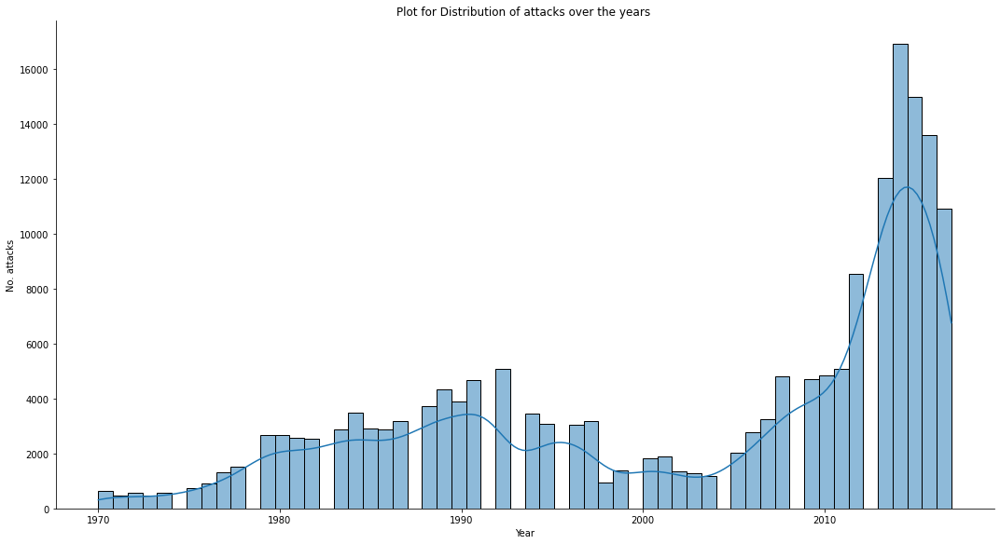

In [42]:
#PLOTTING DISTRIBUTION OF ATTACKS OVER THE YEARS

# fig, ax= plt.subplots(figsize=(15,6))
# plt.rcParams['figure.figsize'] = 15,15
# sns.set(rc = {'figure.figsize':(15,15)})
sns.displot(x="iyear",data=df,kde=True,height=8, aspect=15/8)
plt.title("Plot for Distribution of attacks over the years ")
plt.ylabel("No. attacks")
plt.xlabel("Year");

from 1970 to 1990 there has been a serious growth in terrorist attacks.
Futher,for a decade , till 2000 the attacks kept decreasing.
After that, it increased for a decade.
And for the next decade(starting from 2010), there has been a serious spike. 

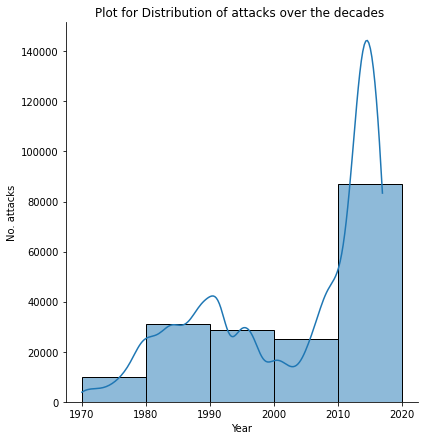

In [43]:
#PLOTTING DISTRIBUTION OF ATTACKS OVER THE DECADES

# fig, ax= plt.subplots(figsize=(15,6))
# plt.rcParams['figure.figsize'] = 15,15
# sns.set(rc = {'figure.figsize':(15,15)})
sns.displot(x="iyear",data=df,kde=True,height=6, aspect=1, binwidth=10)
plt.title("Plot for Distribution of attacks over the decades ")
plt.ylabel("No. attacks")
plt.xlabel("Year");

In [44]:
# monthwise=df.groupby(["imonth"]).size()
# monthwise.drop([0]).plot(kind="bar")
# # monthwise.index


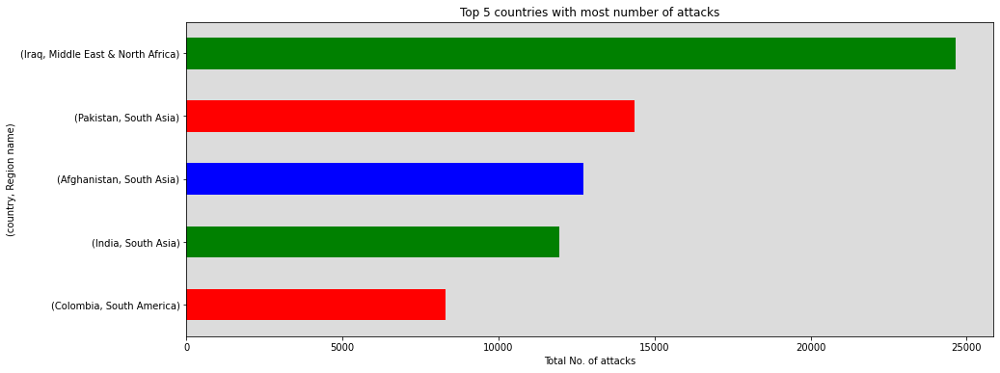

In [45]:
#Countries with most terrorist attacks

fig, ax= plt.subplots(figsize=(15,6))
country_wise=df.groupby(["country_txt","region_txt"]).size().sort_values()
# country_wise.tail()
ax.set_facecolor("gainsboro")
country_wise.tail().plot(kind="barh",ax=ax, color=["R","G","B"])
plt.xlabel("Total No. of attacks")
plt.ylabel("(country, Region name)")
plt.title("Top 5 countries with most number of attacks");


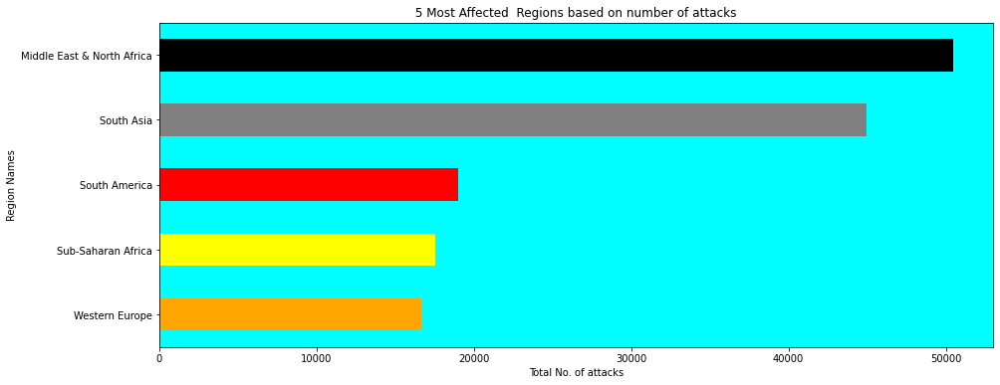

In [46]:
# Regions with most terrorist attacks

fig, ax= plt.subplots(figsize=(15,6))

region_wise=df.groupby(["region_txt"]).size().sort_index()
ax.set_facecolor("aqua")
region_wise.sort_values().tail().plot(kind="barh",ax=ax, color=["Orange","Yellow","R","Grey","Black"])
plt.xlabel("Total No. of attacks")
plt.ylabel("Region Names")
plt.title(" 5 Most Affected  Regions based on number of attacks ");

In [47]:
# Display the locations on a map using plotly express
df[["latitude","longitude"]].head()
fig = px.scatter_mapbox(
    df,  # Our DataFrame
    lat='latitude',
    lon='longitude',
    center={"lat": 28.7, "lon": 77.1},  # Map will be centered on New Delhi,India
    width=1200,  # Width of map
    height=600,  # Height of map
    color="region_txt",#colouring the areas according to Region
    hover_data=["iyear","country_txt","city","attacktype1_txt"],  # Display year and country when hovering mouse over 
)

fig.update_layout(mapbox_style="open-street-map")

fig.show()

Text(0.5, 1.0, 'Horizontal Bar chart of Attack type')

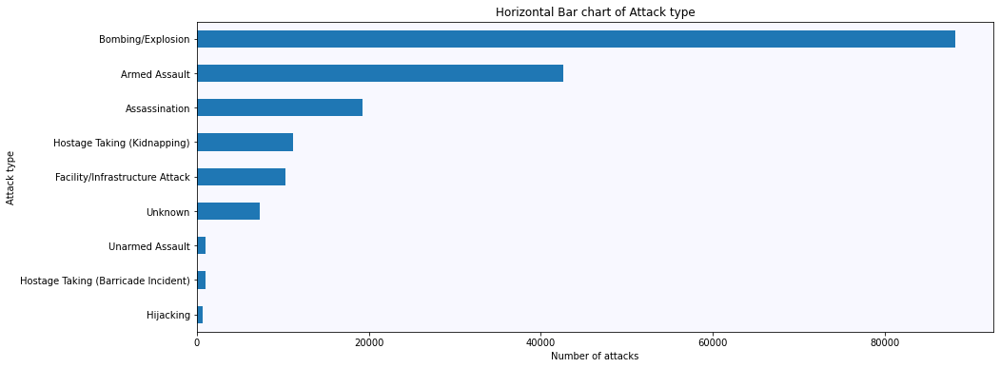

In [48]:
#grouping data based on attack type 

fig, ax= plt.subplots(figsize=(15,6))
attype_wise=df.groupby(["attacktype1_txt"]).size().sort_index()
ax.set_facecolor("ghostwhite")
attype_wise.sort_values().plot(kind="barh",ax=ax,)
plt.ylabel("Attack type")
plt.xlabel("Number of attacks");
plt.title("Horizontal Bar chart of Attack type")

Here, we can observe that <b> bombing and armed assault </b> has been the attack type in most events.

This can be seen from the graph above and also from the region wise analysis in the next cell

In [49]:
randawise=df.groupby(["region_txt","attacktype1_txt"]).size()
print(f"Region-{'':<30}" + "  ------ Most used attack type \n")
for i in df.region_txt.unique():
  print( f"Region-{i:<30}" + "  ------ "+ randawise[i].idxmax())
  

Region-                                ------ Most used attack type 

Region-Central America & Caribbean     ------ Armed Assault
Region-North America                   ------ Bombing/Explosion
Region-Southeast Asia                  ------ Bombing/Explosion
Region-Western Europe                  ------ Bombing/Explosion
Region-East Asia                       ------ Bombing/Explosion
Region-South America                   ------ Bombing/Explosion
Region-Eastern Europe                  ------ Bombing/Explosion
Region-Sub-Saharan Africa              ------ Armed Assault
Region-Middle East & North Africa      ------ Bombing/Explosion
Region-Australasia & Oceania           ------ Bombing/Explosion
Region-South Asia                      ------ Bombing/Explosion
Region-Central Asia                    ------ Bombing/Explosion


In [50]:
randcwise=df.groupby(["region_txt","country_txt"]).size()
print(f"Region-{'':<30}" + "  ------ Country in which most events happened \n")
for i in df.region_txt.unique():
  print(  f"Region-{i:<30}" + "  ------ "+ randcwise[i].idxmax())
  

Region-                                ------ Country in which most events happened 

Region-Central America & Caribbean     ------ El Salvador
Region-North America                   ------ United States
Region-Southeast Asia                  ------ Philippines
Region-Western Europe                  ------ United Kingdom
Region-East Asia                       ------ Japan
Region-South America                   ------ Colombia
Region-Eastern Europe                  ------ Russia
Region-Sub-Saharan Africa              ------ Somalia
Region-Middle East & North Africa      ------ Iraq
Region-Australasia & Oceania           ------ Australia
Region-South Asia                      ------ Pakistan
Region-Central Asia                    ------ Georgia


In [51]:
#grouping by attack and country
attncount_wise=df.groupby(["attacktype1_txt","country_txt"]).size()

for i in df.attacktype1_txt.unique():
  if not i=="Unknown":
     print(f"{i:<35}"+"---"+str(list(attncount_wise[i].sort_values(ascending=False).index[:3])))

Assassination                      ---['United Kingdom', 'Pakistan', 'Colombia']
Hostage Taking (Kidnapping)        ---['India', 'Colombia', 'Afghanistan']
Bombing/Explosion                  ---['Iraq', 'Pakistan', 'Afghanistan']
Facility/Infrastructure Attack     ---['India', 'United States', 'United Kingdom']
Armed Assault                      ---['Pakistan', 'India', 'Iraq']
Hijacking                          ---['Sudan', 'India', 'Philippines']
Unarmed Assault                    ---['India', 'West Bank and Gaza Strip', 'Pakistan']
Hostage Taking (Barricade Incident)---['El Salvador', 'Colombia', 'Peru']


<b> Here we can see Fireams are the mostly used weapon type in many attack type.

 Exception being,</b> Bombing and Facility attack where Explosives and Incendiary weapons are used for destruction

Text(0.5, 1.0, 'Pie chart for Top 5 weapon type used')

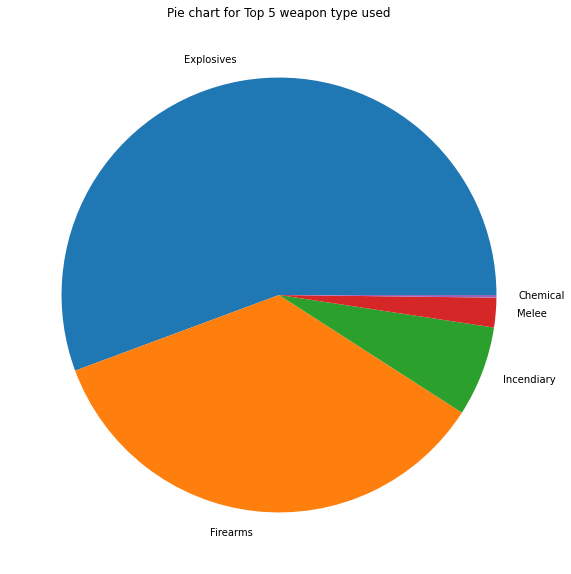

In [52]:
fig, ax= plt.subplots(figsize=(10,10))
df.groupby(["weaptype1_txt"]).size().sort_values(ascending=False).drop("Unknown").head(5).plot(kind="pie",ax=ax)
plt.ylabel("")
plt.title("Pie chart for Top 5 weapon type used")

<b> Here, cumulatively, we can see that Explosives primarily have been used in more events than Firearms since most of the events are of bombings.

<b> <u> Analysis on Suicide Attacks

In [53]:
df["suicide"].unique()

array([0, 1])

''

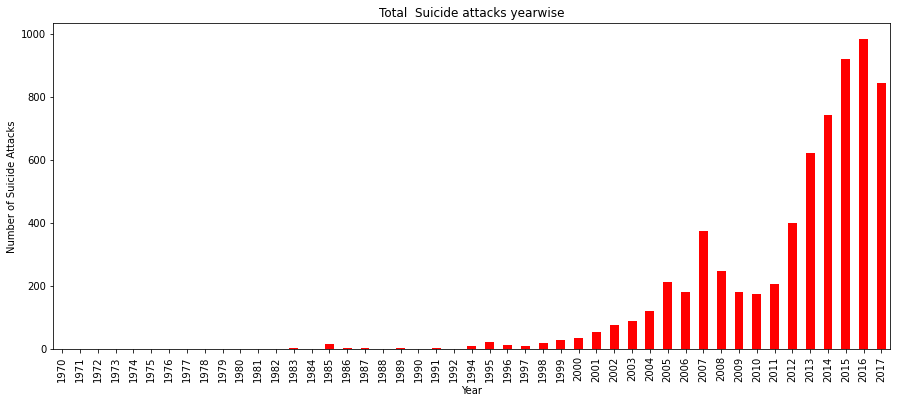

In [54]:
fig, ax= plt.subplots(figsize=(15,6))
suicide_wise=df.groupby(["iyear"])["suicide"].sum()


suicide_wise.plot(kind="bar",ax=ax, color='red')
plt.xlabel("Year")
plt.ylabel("Number of Suicide Attacks")
plt.title("Total  Suicide attacks yearwise")
;
# suicide_wise

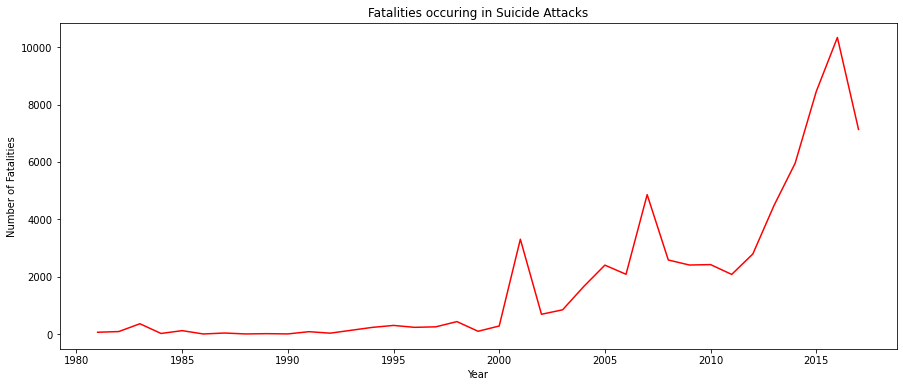

In [55]:
# finding number of fatalities in suicide attacks
fig, ax= plt.subplots(figsize=(15,6))

mask=df["suicide"]==1
df[mask].groupby("iyear").nkill.sum().plot(ax=ax,color="red") 
plt.xlabel("Year")
plt.ylabel("Number of Fatalities")
plt.title("Fatalities occuring in Suicide Attacks");


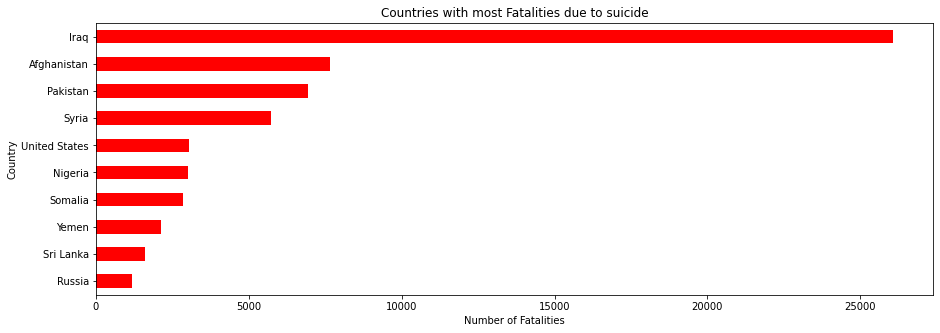

In [56]:
fig, ax= plt.subplots(figsize=(15,5))

mask=df["suicide"]==1
df[mask].groupby("country_txt").nkill.sum().sort_values().tail(10).plot(kind="barh",ax=ax,color="red") 
plt.ylabel("Country")
plt.xlabel("Number of Fatalities")
plt.title("Countries with most Fatalities due to suicide");

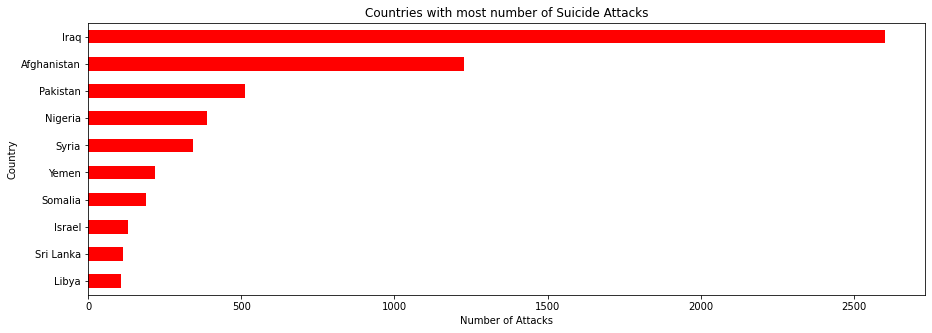

In [57]:
fig, ax= plt.subplots(figsize=(15,5))

mask=df["suicide"]==1
df[mask].groupby("country_txt").size().sort_values().tail(10).plot(kind="barh",ax=ax,color="red") 
plt.ylabel("Country")
plt.xlabel("Number of Attacks")
plt.title("Countries with most number of Suicide Attacks");

<b><u> Analysing events on the basis of Success

Failure     20059
Success    161632
dtype: int64

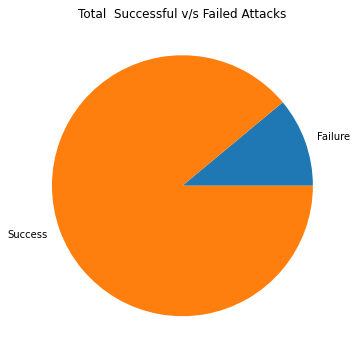

In [58]:
#Finding no. of sucessful events

fig, ax= plt.subplots(figsize=(15,6))
success_wise=df.groupby(["success"]).size()
success_wise.index=["Failure","Success"]

success_wise.plot(kind="pie",ax=ax)
plt.ylabel("")
plt.title("Total  Successful v/s Failed Attacks")
success_wise


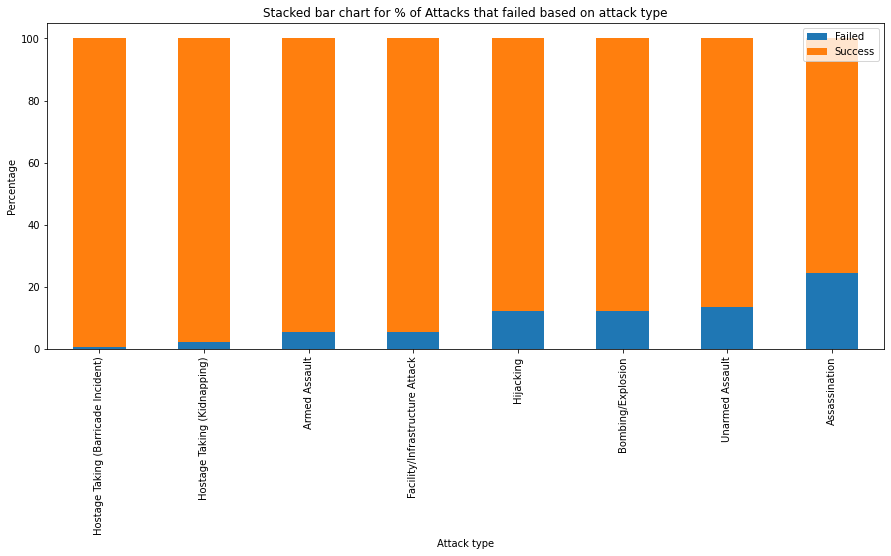

In [59]:
fig, ax= plt.subplots(figsize=(15,6))
succ_attype=(df[df["success"]==0].groupby("attacktype1_txt").size()*100/df.groupby("attacktype1_txt").size()).drop("Unknown").sort_values().to_frame()
succ_attype.rename(columns={0: "Failed"},inplace=True)
succ_attype["Success"]=[100]*8-succ_attype["Failed"]
succ_attype.plot(kind="bar",stacked=True,ax=ax)
plt.title("Stacked bar chart for % of Attacks that failed based on attack type")
plt.legend(loc="best")
plt.xlabel("Attack type")
plt.ylabel("Percentage");



# plt.fill_between(succ_attype.index,succ_attype.values,[0]*8)
# plt.fill_between(succ_attype.index,succ_attype.values,[1]*8, color="orange")
# plt.yticks(np.arange(0,1.2,0.2))
# plt.xticks(rotation=90);


<b><u> Analysing events on the basis of Fatalities and Wounded 

In [60]:

print("Total Fatalities in the period 1970-2017 : ", int(df["nkill"].sum()))
print("Total Wounded in the period 1970-2017 :    ", int(df["nwound"].sum()))

print("% of Total Events which had Fatalities in the period 1970-2017 : ", round((df["nkill"]>0).sum()*100/df.shape[0],2))
print("% of Total Events which had atleat one wounded in the period 1970-2017 : ", round((df["nwound"]>0).sum()*100/df.shape[0],2))

Total Fatalities in the period 1970-2017 :  411868
Total Wounded in the period 1970-2017 :     523869
% of Total Events which had Fatalities in the period 1970-2017 :  45.81
% of Total Events which had atleat one wounded in the period 1970-2017 :  34.18


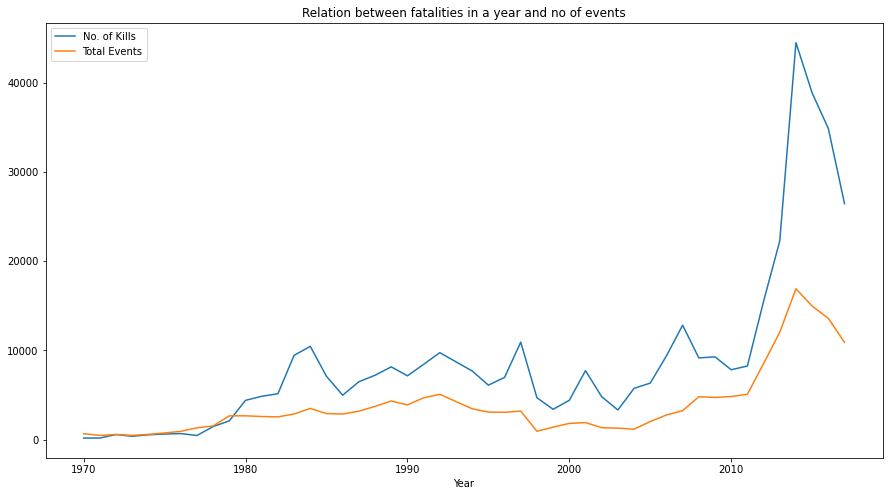

In [61]:
# Analysing fatalities year wise and total no. of events in a year

fig, ax= plt.subplots(figsize=(15,8))
kill_yearwise=df.groupby(["iyear"])['nkill'].sum()
kill_yearwise.name="No. of Kills"
pd.concat([kill_yearwise,yearwise],axis=1).plot(kind="line",ax=ax)
plt.xlabel("Year")
# plt.ylabel("Count")
plt.title("Relation between fatalities in a year and no of events" );

In [62]:

# Summary statistics of fatalities
df[df["nkill"]>0]["nkill"].describe()
#75% of the events which had fatalities(i.e events with nkill>0) have fatalities less that 4


count    83229.000000
mean         4.948612
std         16.183141
min          1.000000
25%          1.000000
50%          2.000000
75%          4.000000
max       1570.000000
Name: nkill, dtype: float64